<a href="https://colab.research.google.com/github/ahmed-elnakeeb/AES_API/blob/main/my_xl_1_0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# pre

In [ ]:
!pip install --upgrade ninja>>1
!pip install --upgrade torch>>1
!pip install "numpy>=1.17" "PyWavelets>=1.1.1" "opencv-python>=4.1.0.25">>1
!pip install --upgrade --no-deps invisible-watermark >>1
!pip install gradio >>1

!pip install  -U xformers>>1
!pip install --upgrade transformers accelerate safetensors >>1
!pip install --upgrade diffusers >>1

In [ ]:
from diffusers import DiffusionPipeline
import torch
import gc



In [ ]:
pipe = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, use_safetensors=True, variant="fp16")
pipe.to("cuda")
# pipe.enable_model_cpu_offload()
pipe.enable_xformers_memory_efficient_attention()
pipe.unet = torch.compile(pipe.unet, mode="reduce-overhead", fullgraph=True)



In [ ]:
def infer(prompt:str, negative:str="", scale:float=10, steps:int=50,seed:int=0, images:int=1):
  results=[]

  if seed != 0:

    for i in range(0, images):
        generator = torch.Generator("cuda").manual_seed(int(seed))

        images = pipe(prompt=prompt,generator=generator, negative_prompt=negative, guidance_scale=scale, num_inference_steps=steps).images
        gc.collect()
        torch.cuda.empty_cache()
        results.append(images[0])
        seed+=1000
  else:

      for i in range(0, images):

        images = pipe(prompt=prompt,negative_prompt=negative, guidance_scale=scale, num_inference_steps=steps).images
        gc.collect()
        torch.cuda.empty_cache()
        results.append(images[0])
  return results



In [ ]:
# https://supagruen.github.io/StableDiffusion-CheatSheet/
li=["Abbey, Edwin Austin","Achenbach, Andreas","Ackroyd, Norman",
    "Adams, Ansel","Adams, Art (Arthur)","Adams, Neal","Adolfsson, Mattias",
    "Aenami, Alena","Afremov, Leonid","Afshar, Petros","Aivazovsky, Ivan",
    "Aja, David","Albi, Alessio","Albuquerque, Rafael","Aldridge, Miles",
    "Alizadeh, Shahab","Allred, Mike","Altdorfer, Albrecht","Amano, Yoshitaka",
    "Amaral, Tarsila do","Amiet, Cuno","Amorsolo, Fernando","Anacleto, Jay",
    "Ancher, Anna","Anderson, Richard","Anderson, Wes","Andreev, Alex",
    "Andrews, Esao","Ansin, Martin","Aoshima, Chiho","Appel, Karel",
    "Apterus, Sabbas (Peter Polach)","Archipenko, Alexander",
    "Arcimboldo, Giuseppe","Ardon, Mordecai","Armstrong, Rolf",
    "Arnegger, Alois","Arntzenius, Floris","Arrivabene, Agostino",
    "Artgerm (Stanley Lau)","Asencio, Henry","Ast, Balthasar van der",
    "Astrup, Nikolai","Atget, Eugène","Audubon, John James","Auerbach, Frank",
    "Avedon, Richard","Bachalo, Chris","Bachelier, Anne","Bagshaw, Tom",
    "Bailly, Alice","Bak, Karol","Bakshi, Ralph","Balaskas, Christopher",
    "Balivet, Emily","Balke, Peder","Bana, Benedick","Barbier, George",
    "Barker, Clive","Barlowe, Wayne","Barnes, Ernie","Barnet, Will",
    "Barrett, Angela","Barson, Paul","Bartlett, Bo","Baugh, Casey",
    "Beal, Gifford","Beardsley, Aubrey","Beatrix Potter",
    "Beeple (Mike Winkelmann)","Beksiński, Zdzisław","Bellmer, Hans",
    "Bellows, George Wesley","Bemelmans, Ludwig","Benois, Alexandre",
    "Bergey, Earle K.","Berkey, John","Bernini, Gian Lorenzo","Beskow, Elsa",
    "Bidgood, James","Biernacki, Szymon","Bierstadt, Albert",
    "Biggers, John Thomas","Bilal, Enki","Bilibin, Ivan","Billy, Butcher",
    "Binkley, Ed","Bischoff, Elmer","Bisley, Simon","Bissell, Robert",
    "Blair, Mary","Blanchard, Antoine","Blanche, John","Blandin, Tim",
    "Blevins, Neil","Boccioni, Umberto","Bolland, Brian","Bonestell, Chesley",
    "Bonhomme, Olivier","Booth, Franklin","Bors, Matt","Bosch, Hieronymus",
    "Bosma, Sam","Bosschaert, Ambrosius (the Elder)","Bosschart, Johfra",
    "Botero","Botticelli, Sandro","Boucher, François","Bowater, Charlie",
    "Bowers, David Michael","Bowling, Frank","Boys, Thomas Shotter",
    "Bradley, Noah","Bramley, Frank","Bridgman, George B.","Briggs, Austin",
    "Britto, Romero","Brogan, Glen","Brom, Gerald","Burne-Jones, Edward",
    "Burns, Jim","Bussière, Gaston","Böcklin, Arnold","Cadell, Francis",
    "Cadmus, Paul","Caldwell, Clyde","Calleri, Fred","Camoin, Charles",
    "Campbell Cooper, Colin","Campion, Pascal","Caniff, Milton","Carpio, Pablo",
    "Carson, Michael","Caruso, Santiago","Cassegrain, Didier",
    "Casson, Alfred Joseph","Catherall, Paul","Cearley, Clint",
    "Cecile, Agnes (Silvia Pelissero)","Chagall, Marc","Chamberlain, John",
    "Chardin, Jean Siméon","Charest, Travis","Chavannes, Pierre Puvis de",
    "Cheng, Hsiao-Ron ","Cheng, Yanjun","Chermayeff, Ivan","Cheval, Michael",
    "Chevrier, Sandra","Cho, Frank","Christensen, James C.",
    "Cimabue (Cenni di Pepo)","Ciurlionis, Mikalojus","Clarke, Harry",
    "Clive, Henry","Cloonan, Becky","Cobb, Ron","Coburn, Alvin Langdon",
    "Cold, Chris","Conder, Charles Edward","Condo, George","Constable, John",
    "Coomber, Yvonne","Corben, Richard","Corfield, Paul",
    "Corot, Jean-Baptiste Camille","Coss, Shawn","Cossa, Francesco del",
    "Crane, Walter","Crepax, Guido","Crewdson, Gregory","Criswell, Debbie",
    "Crosby, Njideka Akunyili","Cross, Henri Edmond","Crécy, Nicolas de",
    "Currin, John","Cézanne, Paul","Da Vinci, Leonardo","DaLuz, Steven",
    "Daeni, Pino","Dahl-Wolfe, Louise","Dalrymple, Farel","Darger, Henry",
    "Darrow, Geof","Daumier, Honoré","David, Jacques-Louis","Davis, Jack",
    "Davis, Marc","Davison, Craig","De Ro, Jonas","DeConnick, Kelly Sue",
    "DeForge, Michael","Deakin, Edwin","Degas, Edgar",
    "Delaunay, Robert Victor Félix","Delort, Nicolas","Delville, Jean",
    "Delvoye, Wim","Denis, Maurice","Denning, Guy","Deodato, Mike",
    "Detmold, Charles Maurice","Di Fate, Vincent","Dillon, Diane",
    "Ditko, Steve","Dittmann, Anna","Doré, Gustave","Downton, David",
    "Doyle, Tim","Driskell, David C.","Druillet, Philippe","Dubuffet, Jean",
    "Duchamp-Villon, Raymond","Duddle, Jonny","Dulac, Edmund",
    "Durand, Asher Brown","Dyer, Chris","Dürer, Albrecht","Eakins, Thomas",
    "Earle, Eyvind","Earles, Amy","Easley, Jeff","Eaton, Tristan",
    "Edlin, Tyler","Edmiston, Jason","Eggleston, William","Eggleton, Bob",
    "Eisner, Will","El Greco (Domínikos Theotokópoulos)","Ellis, Dean",
    "Elsheimer, Adam","Elson, Peter","Elvgren, Gil","Emshwiller, Ed",
    "Eng, Kilian","Enjolras, Delphin","Erni, Hans","Ernst, Maximilian Maria",
    "Erté (Romain de Tirtoff)","Escher, Maurits Cornelis","Eversen, Adrianus",
    "Fabry, Glenn","Fadeev, Anton","Fairey, Shepard","Fairhurst, Andy",
    "Falter, John Philip","Fang, Lijun","Fantin-Latour, Henri",
    "Fegredo, Duncan","Feininger, Lyonel","Ferez, Andrew","Ferri, Roberto",
    "Ferriss, Hugh","Finlay, Virgil","Finnstark, Anato","Fischer, Paul Gustav",
    "Fischinger, Oskar","Flavin, Dan","Flinck, Govert","Flint, Alex Russell",
    "Foksowicz, Piotr","Forbes, Stanhope","Fortescue-Brickdale, Eleanor",
    "Foss, Chris","Foster, Hal","Foster, Jon","Fra Angelico","Fraction, Matt",
    "Fragonard, Jean-Honoré","Francavilla, Franc"]

examples = [
    [
        'A high tech solarpunk utopia in the Amazon rainforest',
        'low quality',
        9
    ],
    [
        'A pikachu fine dining with a view to the Eiffel Tower',
        'low quality',
        9
    ],
    [
        'A mecha robot in a favela in expressionist style',
        'low quality, 3d, photorealistic',
        9
    ],
    [
        'an insect robot preparing a delicious meal',
        'low quality, illustration',
        9
    ],
    [
        "A small cabin on top of a snowy mountain in the style of Disney, artstation",
        'low quality, ugly',
        9
    ],
]


# run

In [ ]:
import gradio as gr
import cv2 as cv



block=gr.Blocks()
with block as demo:
    prombt=gr.Textbox(label="prombt")
    negative_prombt=gr.Textbox(label="negative prombt")
    gs=gr.Slider(1,100,label="scale",value=10)
    steps=gr.Slider(20,100,step=1,label="steps",value=50)
    seed=gr.Number(label="seed")
    number_images=gr.Slider(1,10,step=1,label="images")
    styles=gr.Dropdown(li)

    draw=gr.Button("draw")
    imout=gr.Gallery(label="output")

    inputs=[prombt,negative_prombt,gs,steps,seed,number_images]
    ouputs=[imout]

    draw.click(infer ,inputs=inputs,outputs=ouputs)

    clear_button = gr.ClearButton(label="Clear",components=inputs+ouputs)
    with gr.Row():
        ex = gr.Examples(examples=examples, fn=infer, inputs=inputs,outputs=ouputs, cache_examples=False)
        ex.dataset.headers = [""]
demo.queue()
demo.launch(server_port=102,debug=True,share=True)


Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Running on public URL: https://4c55027f3a6d523462.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

# testing

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
inf=dict()
inf["prompt"] = "a logo for a company named ahmed "
inf["negative"]="bad anatomy, extra fingers"
inf["scale"]=10
# inf["seed"]=7987
inf["steps"]=10
# inf["height"]=1024
# inf["width"]=1024
inf["images"]=1
images=infer(**inf)


  0%|          | 0/10 [00:00<?, ?it/s]

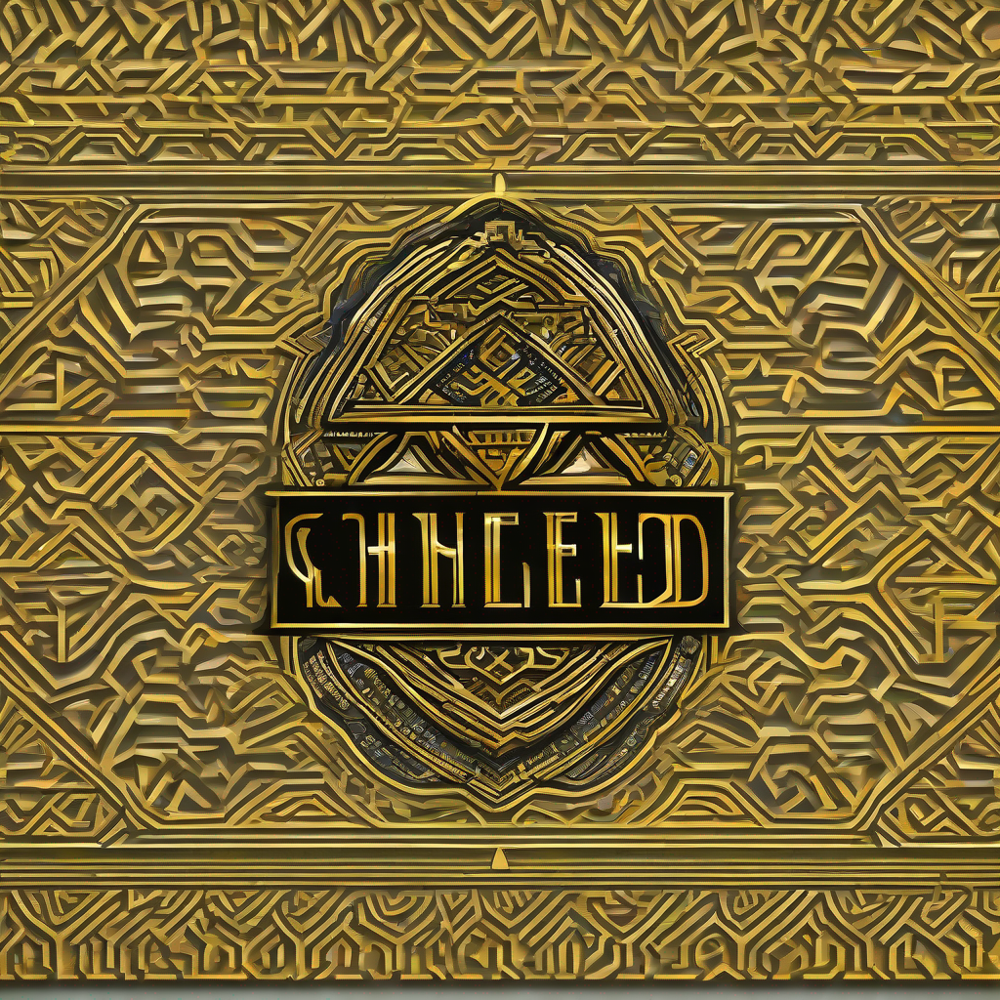

In [ ]:
from IPython.display import display

# Display the output of Stable Diffusion
for img in images:
    display(img)

In [ ]:
# products
products=["boy","shark toy identity"]
# Color schemes
color_schemes = ['red and black', 'blue and green', 'orange and yellow', 'black and white', 'purple and pink', 'green and blue', 'pink and purple', 'yellow and orange', 'red and white', 'blue and gray', 'black and gold', 'brown and beige', 'gray and yellow']

# Typography
typography = ['serif', 'sans-serif', 'script', 'bold', 'italic', 'slab serif', 'display', 'handwriting', 'light', 'heavy', 'condensed', 'extended']

# Styles
styles = ['modern', 'vintage', 'minimalist', 'abstract', 'geometric', 'retro', 'futuristic', 'hand-drawn', 'organic', 'industrial', 'grunge', 'elegant']

# Types
types = ['monogram logos', 'wordmark logos', 'pictorial mark logos', 'abstract logo marks', 'mascot logos','emblem logos','negative space logos','dynamic logos','3D logos','animated logos','minimalist logos']
# init_seed=0
r=1
for product in products:
  for color in color_schemes:
    # for typograph in typography:
      for style in styles:
        for typ in types:
          for _ in range (r):
            try:
              inf=dict()
              # inf["prompt"] =f"a {product} for a company named Elnakeeb (NKB for short), color scheme: {color}, typograghy: {typograph}, style: {style}, type: {typ}"
              inf["prompt"] =f"a {product} for a company named Elnakeeb (NKB for short), color scheme: {color}, style: {style}, type: {typ}"
              # inf["negative"]="bad anatomy, extra fingers"
              inf["scale"]=10
              # inf["seed"]=7987
              inf["steps"]=50
              # inf["height"]=1024
              # inf["width"]=1024
              inf["images"]=2
              images=infer(**inf)
              c=1
              for img in images:
                img.save(f"drive/MyDrive/xl/NKB/{inf['prompt']} c{c}.png")
                c+=1
            except :
              print( inf["prompt"])

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

# refiner

In [ ]:
import torch
from diffusers import StableDiffusionXLImg2ImgPipeline
from diffusers.utils import load_image

pipe_images = StableDiffusionXLImg2ImgPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
pipe_images = pipe_images.to("cuda")
url = "https://i.pinimg.com/originals/39/49/b7/3949b742d955db0e8b5277a77994a5d9.jpg"

init_image = load_image(url).convert("RGB")
prompt = "naruto"
image = pipe_images(prompt, image=init_image).images[0]

In [ ]:
url = "https://i.pinimg.com/originals/39/49/b7/3949b742d955db0e8b5277a77994a5d9.jpg"

init_image = load_image(url).convert("RGB")
prompt = "kid naruto low res"
generator = torch.Generator("cuda").manual_seed(2)

gc.collect()
image = pipe_images(prompt,num_inference_steps=100,image=init_image,).images[0]

# info

In [ ]:
!nvcc --version



In [ ]:
!nvidia-smi

In [ ]:
! pip freeze --all |grep torch

# auto fill

In [ ]:
import torch
from diffusers import StableDiffusionXLInpaintPipeline
from diffusers.utils import load_image

pipe_auto_fill = StableDiffusionXLInpaintPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True
)
pipe_auto_fill.to("cuda")

img_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo.png"
mask_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo_mask.png"

init_image = load_image(img_url).convert("RGB")
mask_image = load_image(mask_url).convert("RGB")

prompt = "A majestic tiger sitting on a bench"
image = pipe_auto_fill(prompt=prompt, image=init_image, mask_image=mask_image, num_inference_steps=10, strength=0.80).images[0]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

In [ ]:
def infer_auto_fill(prompt:str, image, mask_image, negative:str="", guidance_scale:float=10,
                    num_inference_steps:int=50,seed:int=0, images:int=1,strength:float=0.80):
  results=[]

  if seed != 0:

    for i in range(0, images):
        generator = torch.Generator("cuda").manual_seed(int(seed))

        images = pipe_auto_fill(prompt=prompt,generator=generator,
                                image=init_image, mask_image=mask_image,
                                negative_prompt=negative, guidance_scale=guidance_scale,
                                num_inference_steps=num_inference_steps,
                                strength=strength).images
        gc.collect()
        torch.cuda.empty_cache()
        results.append(images[0])
        seed+=1000
  else:
      for i in range(0, images):

        images = pipe_auto_fill(prompt=prompt,negative_prompt=negative,
                                image=init_image, mask_image=mask_image,
                                guidance_scale=guidance_scale, num_inference_steps=num_inference_steps,
                                strength=strength).images
        gc.collect()
        torch.cuda.empty_cache()
        results.append(images[0])

  return results

In [ ]:

img_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo.png"
mask_url = "https://raw.githubusercontent.com/CompVis/latent-diffusion/main/data/inpainting_examples/overture-creations-5sI6fQgYIuo_mask.png"

init_image = load_image(img_url).convert("RGB")
mask_image = load_image(mask_url).convert("RGB")

prompt = "A majestic tiger sitting on a bench"

images = infer_auto_fill(prompt=prompt, image=init_image, mask_image=mask_image, num_inference_steps=50, strength=0.80,images=4)

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

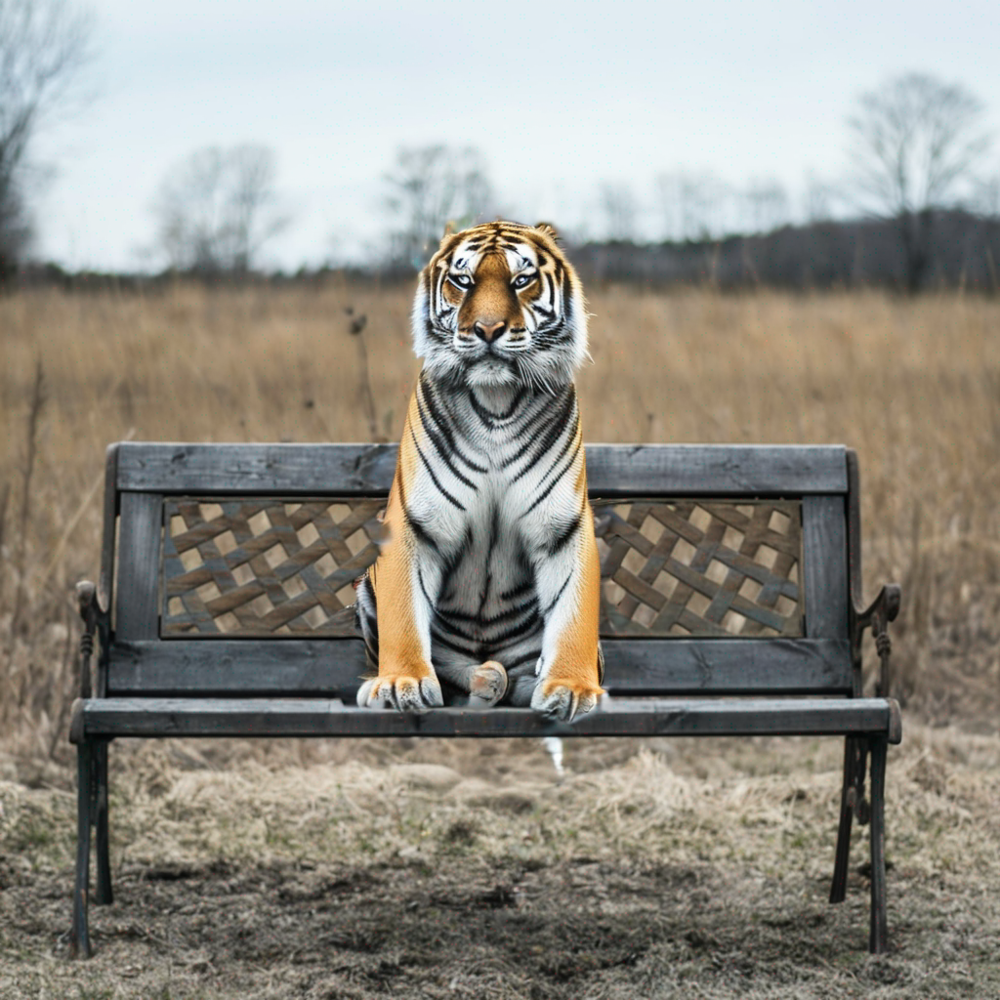

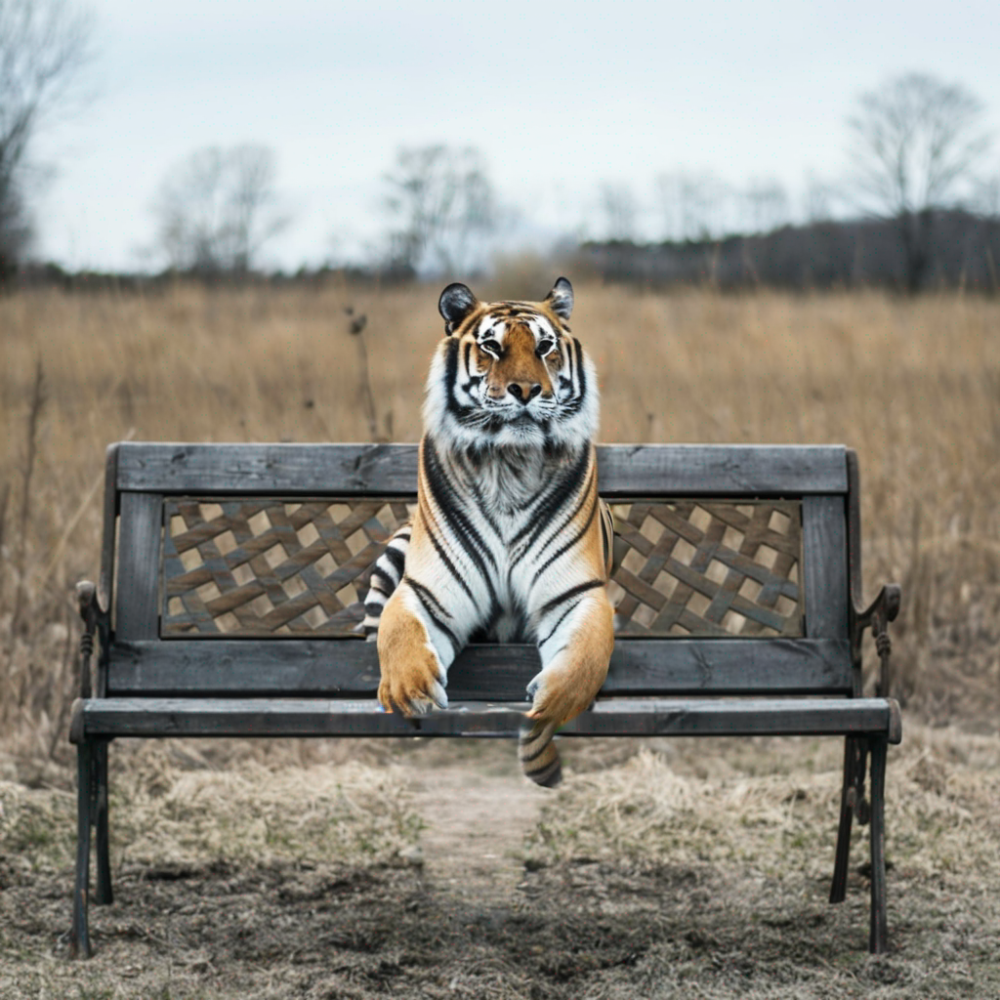

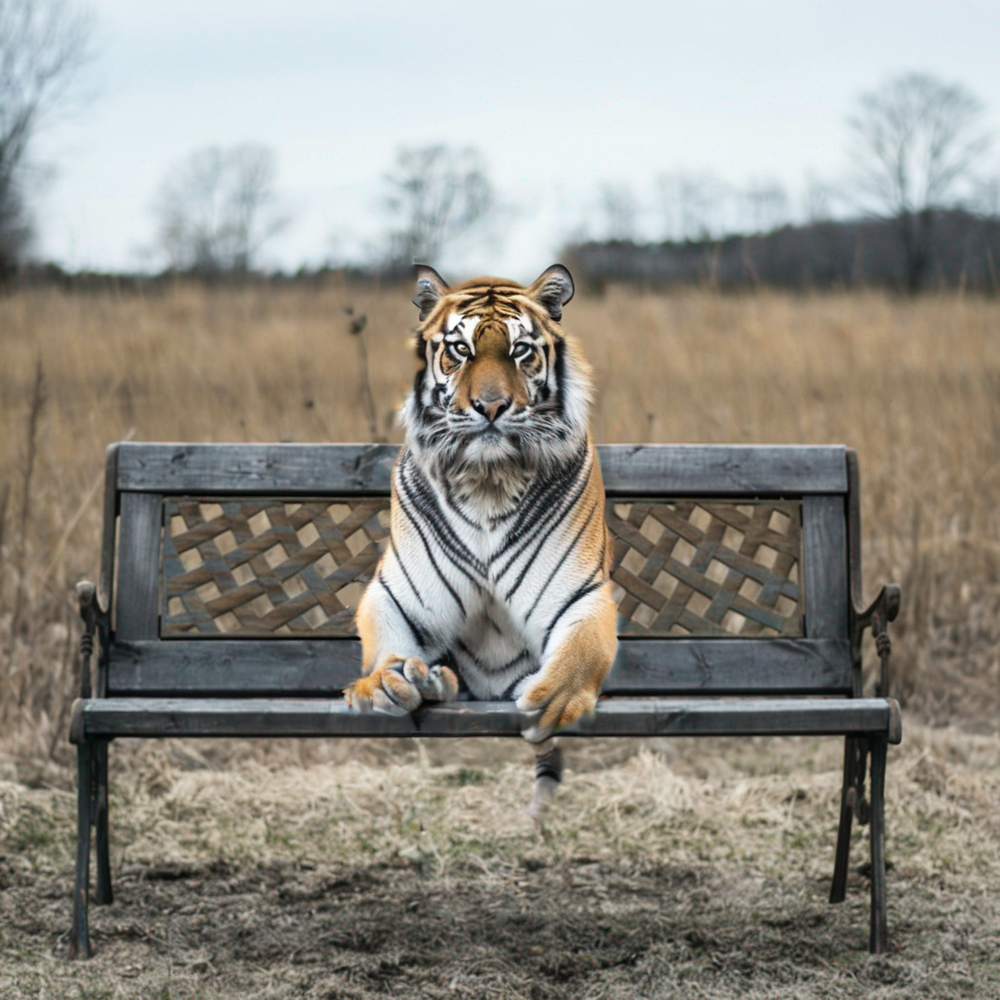

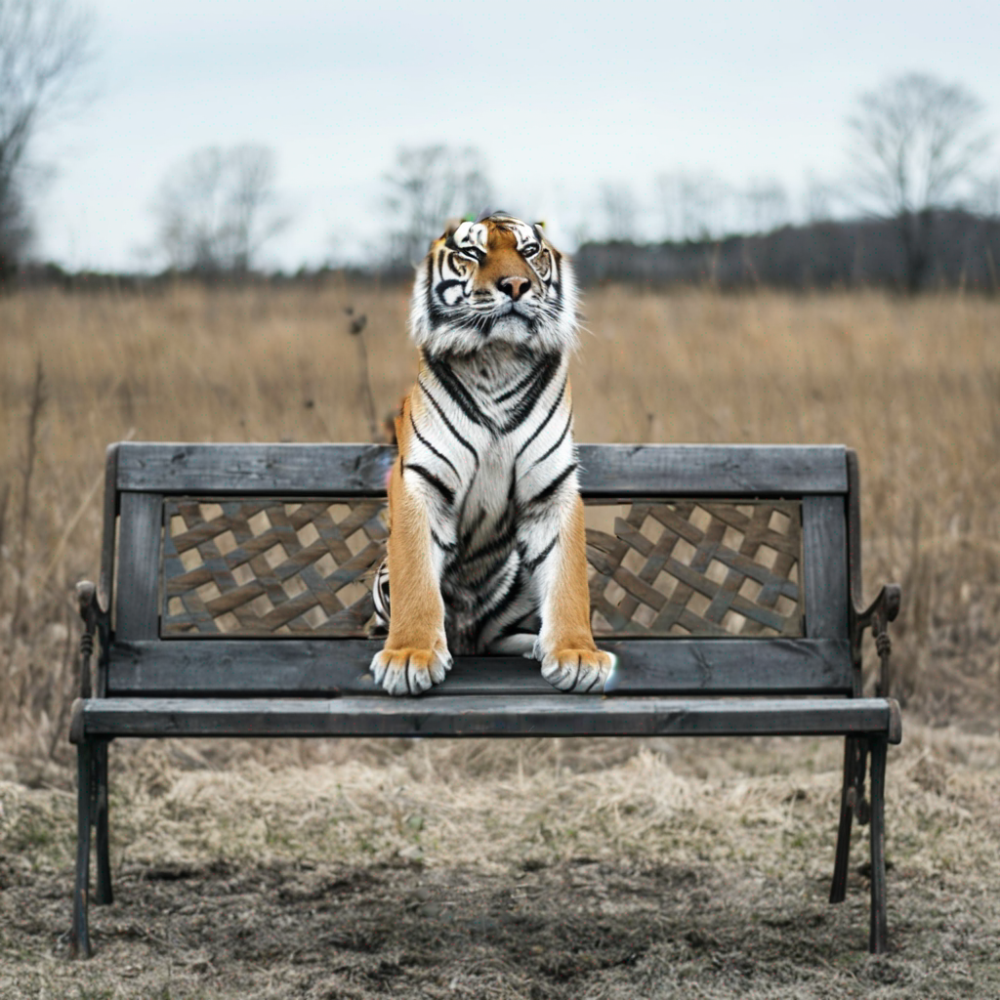

In [ ]:
from IPython.display import display

# Display the output of Stable Diffusion
for img in images:
    display(img)